# Image to image with Azure Computer Vision and Azure Open AI for Dall e 2

We are going to use **Azure Computer Vision 4 Florence** to get the main caption and the tags from an existing image.
Then we will use these information as a prompt to generate an artificial image using **Azure Open AI and Dall e 2** integration.

In [1]:
import os
import requests
import random
import time

from datetime import datetime
from dotenv import load_dotenv
from io import BytesIO
from IPython.display import display
from IPython.display import Image as viewimage
from matplotlib import pyplot as plt
from PIL import Image

In [2]:
IMAGES_DIR = "images"

In [3]:
RESULTS_DIR = "artificial_images"

os.makedirs(RESULTS_DIR, exist_ok=True)

## Functions

In [4]:
def get_caption(imagefile):
    """
    Get caption from an image using Azure Computer Vision 4
    """
    # Get key and endpoint
    load_dotenv("azure.env")
    key = os.getenv("azure_cv_key")
    endpoint = os.getenv("azure_cv_endpoint")

    # settings
    options = "&features=caption,tags"
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/imageanalysis:analyze" + model + options
    headers = {
        "Content-type": "application/octet-stream",
        "Ocp-Apim-Subscription-Key": key,
    }

    # Read the image file
    with open(imagefile, "rb") as f:
        data = f.read()

    # Sending the requests
    r = requests.post(url, data=data, headers=headers)
    results = r.json()
    # Parsing the results
    image_caption = results["captionResult"]["text"]
    tags = results["tagsResult"]["values"]
    tags_str = ",".join(item["name"] for item in tags)
    image_desc = image_caption + "," + tags_str

    return image_desc

In [5]:
def dalle2generation(caption):
    """
    Generate an image from a prompt with Dall e 2
    """
    # Get the key and endpoint
    api_key = os.getenv("azure_openai_key")
    api_base = os.getenv("azure_openai_endpoint")

    # Settings
    api_version = "2022-08-03-preview"
    url = "{}dalle/text-to-image?api-version={}".format(api_base, api_version)
    headers = {"api-key": api_key, "Content-Type": "application/json"}
    body = {"caption": caption, "resolution": "1024x1024"}

    # Sending the request
    submission = requests.post(url, headers=headers, json=body)
    operation_location = submission.headers["Operation-Location"]
    retry_after = submission.headers["Retry-after"]
    status = ""

    while status != "Succeeded":
        time.sleep(int(retry_after))
        response = requests.get(operation_location, headers=headers)
        status = response.json()["status"]

    # Parsing the result
    image_url = response.json()["result"]["contentUrl"]
    response = requests.get(image_url)

    # Saving the generated image
    dalle2image = Image.open(BytesIO(response.content))
    outputfile = os.path.join(
        RESULTS_DIR,
        caption[:50]
        + "_"
        + str(datetime.now().replace(microsecond=0).strftime("%Y%m%d_%H%M%S"))
        + ".jpg",
    )
    outputfile = outputfile.replace(",", "_")
    outputfile = outputfile.replace(" ", "_")
    dalle2image.save(outputfile)

    return outputfile

In [6]:
def get_dalle2_image(imagefile):
    """ "
    Getting captions and then creating the artificial image
    """
    start = time.time()
    # Get the descriptors for the prompt
    image_desc = get_caption(imagefile)

    # Generating the artificial image from the prompt
    outputfile = dalle2generation(image_desc)

    # Print
    print("\033[1;31;34mGenerating the artificial image from", imagefile)
    print("\033[1;31;32m")
    print("Prompt:", image_desc)
    print("\033[1;31;35m")
    print("Artificial image filename:", outputfile)

    # Resizing the image for the display
    image = Image.open(outputfile)
    width = int((512 / image.size[1]) * image.size[0])
    image = image.resize((width, 512))

    # View the generated image
    display(image)

    elapsed = time.time() - start
    print("\033[1;31;34m")
    print("Powered by Azure Computer Vision and Azure Open AI")

    return outputfile

In [7]:
def side_by_side(image1, image2):
    """
    Display two images side by side
    """
    # Reading images
    img1 = plt.imread(image1)
    img2 = plt.imread(image2)

    # Subplots
    f, ax = plt.subplots(1, 2, figsize=(15, 8))
    ax[0].imshow(img1)
    ax[1].imshow(img2)

    # Titles
    ax[0].set_title("Initial image")
    ax[1].set_title("Artificial image")
    title = "Artificial image using Azure Computer Vision and Azure Open AI"
    f.suptitle(title, fontsize=15)
    plt.tight_layout()

    # Removing the axis
    ax[0].axis("off")
    ax[1].axis("off")

    plt.show()

## Testing

In [8]:
jpg_files = [file for file in os.listdir(IMAGES_DIR) if file.endswith(".jpg")]
jpg_files

['image (1).jpg',
 'image (2).jpg',
 'image (3).jpg',
 'image (4).jpg',
 'image (5).jpg',
 'image (6).jpg',
 'image (7).jpg',
 'image (8).jpg',
 'image (9).jpg']

image (1).jpg


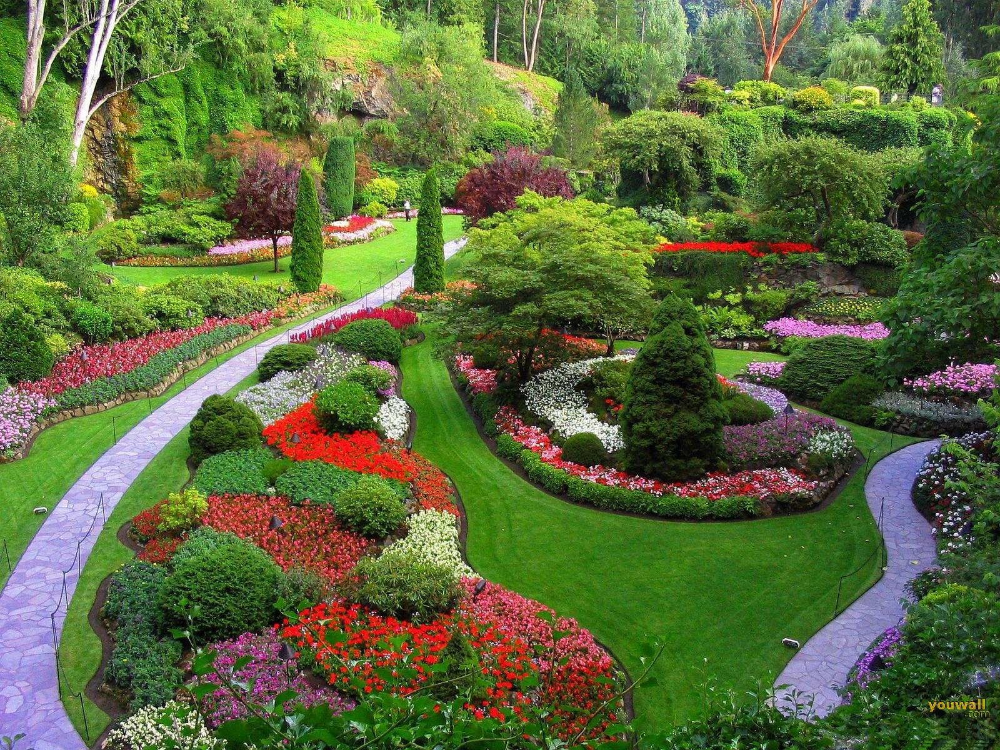

In [9]:
file = jpg_files[0]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (1).jpg

Prompt: a garden with many different flowers with Butchart Gardens in the background,tree,botanical garden,outdoor,landscaping,garden,shrub,grass,groundcover,plant,hedge,annual plant,park,yard,spring,flower

Artificial image filename: artificial_images/a_garden_with_many_different_flowers_with_Butchart_20230525_101000.jpg


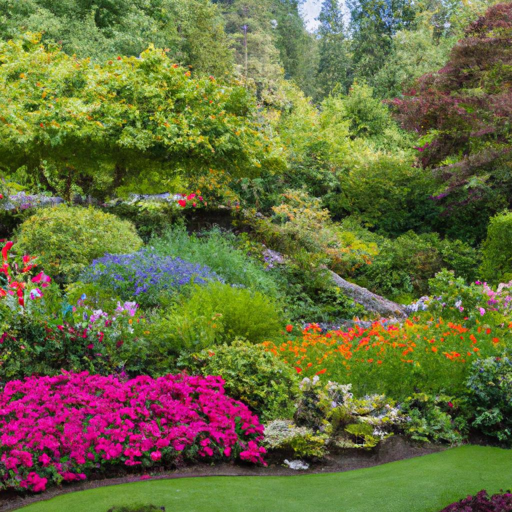


Powered by Azure Computer Vision and Azure Open AI


In [10]:
outputfile = get_dalle2_image(imagefile)

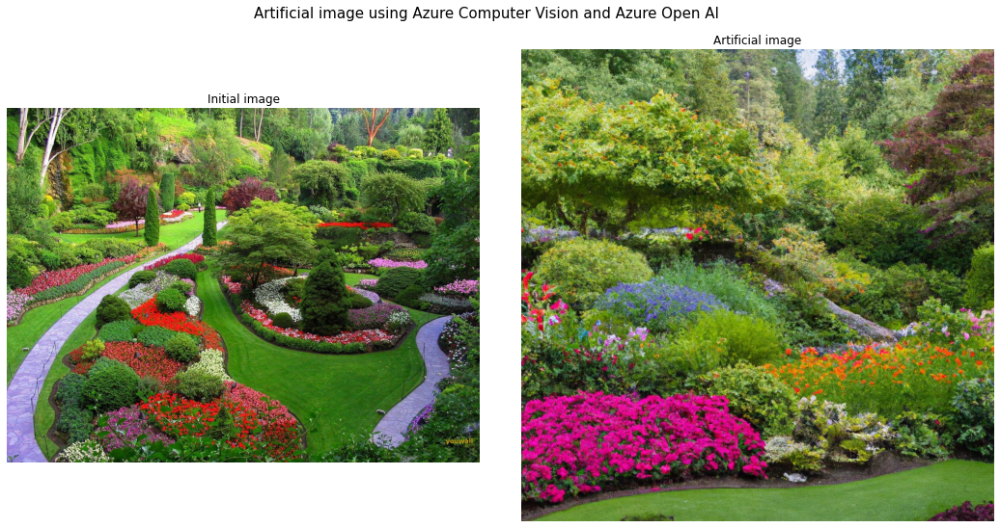

In [11]:
side_by_side(imagefile, outputfile)

image (2).jpg


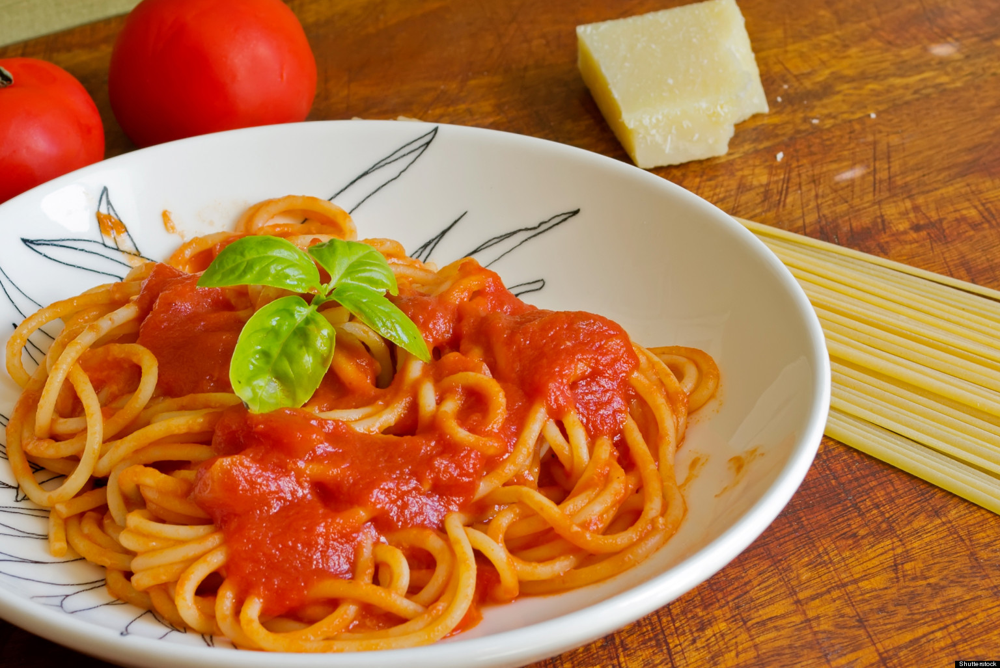

In [12]:
file = jpg_files[1]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (2).jpg

Prompt: a plate of spaghetti with sauce and basil on top,food,dish,cuisine,italian food,ingredient,staple food,pasta pomodoro,noodle,vegetable,indoor,al dente,spaghetti,sauces,tomato,pasta,table

Artificial image filename: artificial_images/a_plate_of_spaghetti_with_sauce_and_basil_on_top_f_20230525_101025.jpg


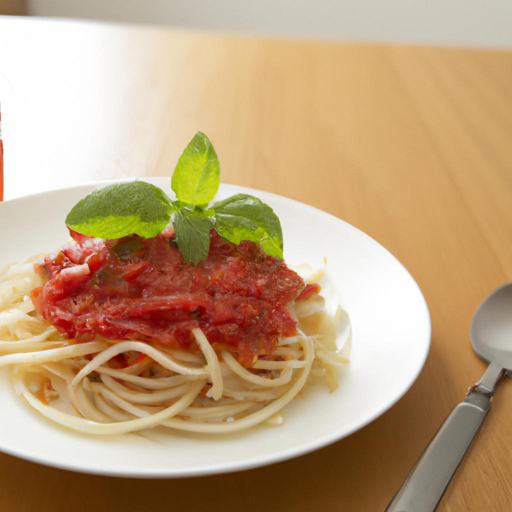


Powered by Azure Computer Vision and Azure Open AI


In [13]:
outputfile = get_dalle2_image(imagefile)

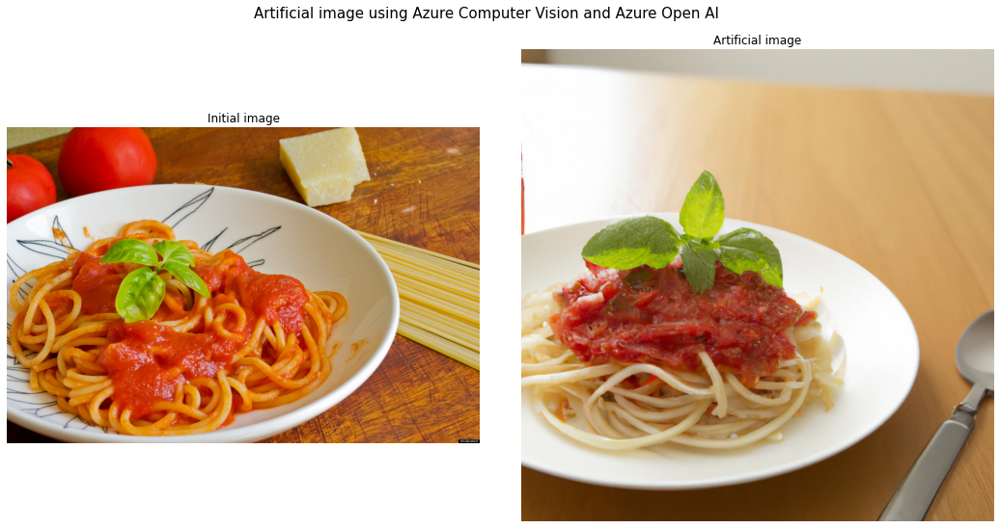

In [14]:
side_by_side(imagefile, outputfile)

image (3).jpg


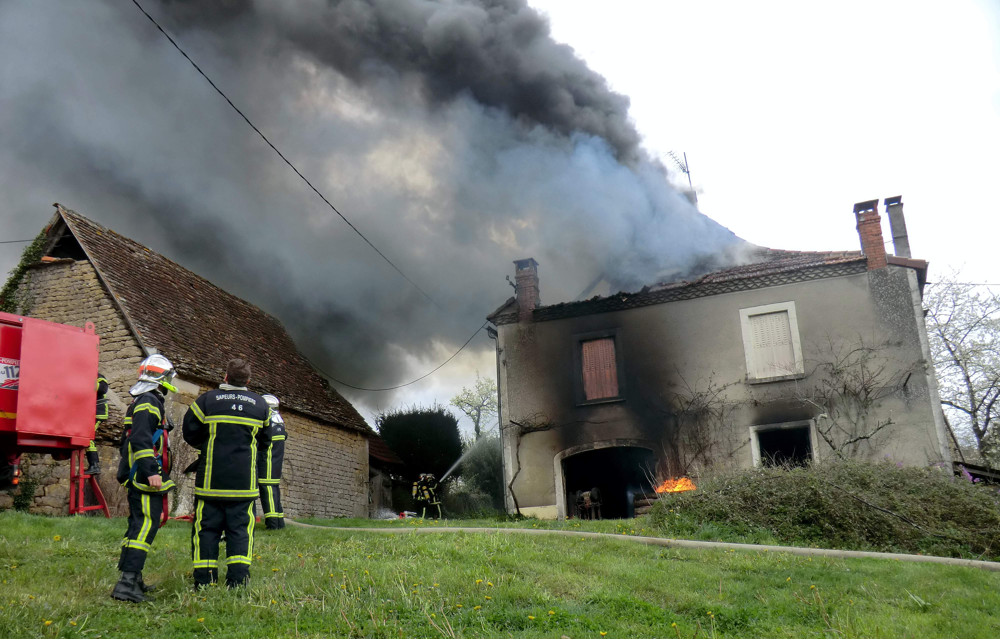

In [15]:
file = jpg_files[2]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (3).jpg

Prompt: a firemen standing in front of a building with smoke coming out of it,outdoor,sky,grass,firefighter,cloud,fire,pollution,building,disaster,smoke

Artificial image filename: artificial_images/a_firemen_standing_in_front_of_a_building_with_smo_20230525_101053.jpg


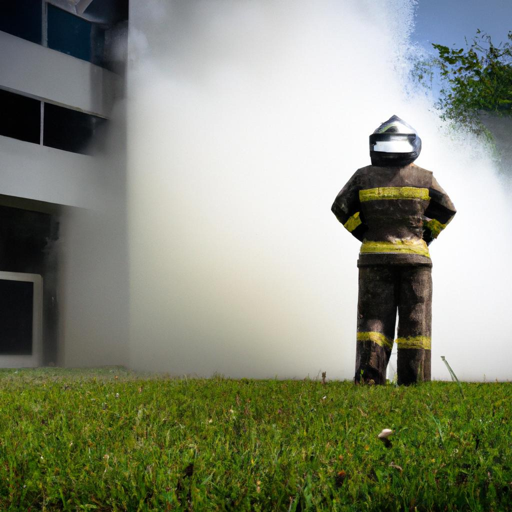


Powered by Azure Computer Vision and Azure Open AI


In [16]:
outputfile = get_dalle2_image(imagefile)

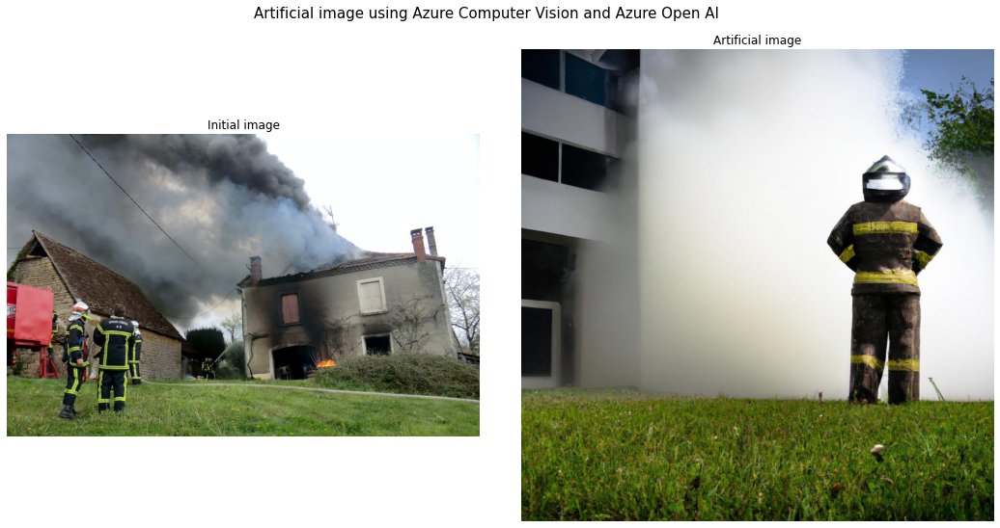

In [17]:
side_by_side(imagefile, outputfile)

image (4).jpg


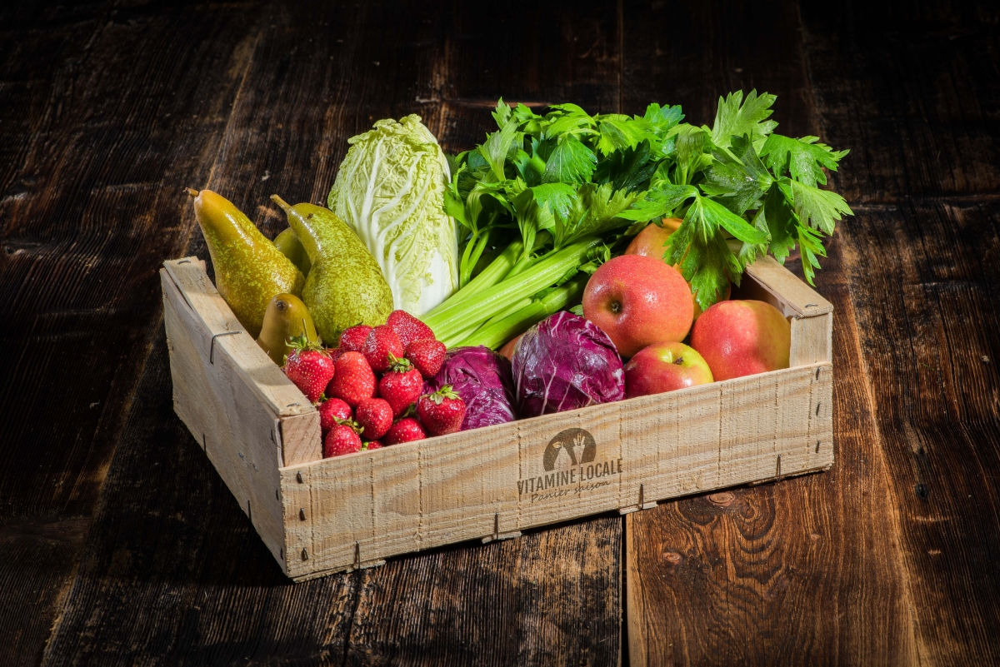

In [18]:
file = jpg_files[3]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (4).jpg

Prompt: a wooden box of vegetables,natural foods,whole food,vegan nutrition,local food,diet food,superfood,food group,vegetarian food,leaf vegetable,greengrocer,staple food,cruciferous vegetables,ingredient,still life,food,root vegetable,apple,vegetable,fruit,wooden,indoor,fresh,floor,wood,produce,plant,lettuce

Artificial image filename: artificial_images/a_wooden_box_of_vegetables_natural_foods_whole_foo_20230525_101115.jpg


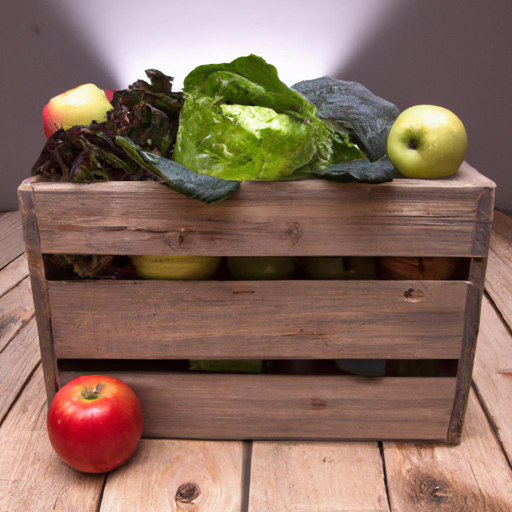


Powered by Azure Computer Vision and Azure Open AI


In [19]:
outputfile = get_dalle2_image(imagefile)

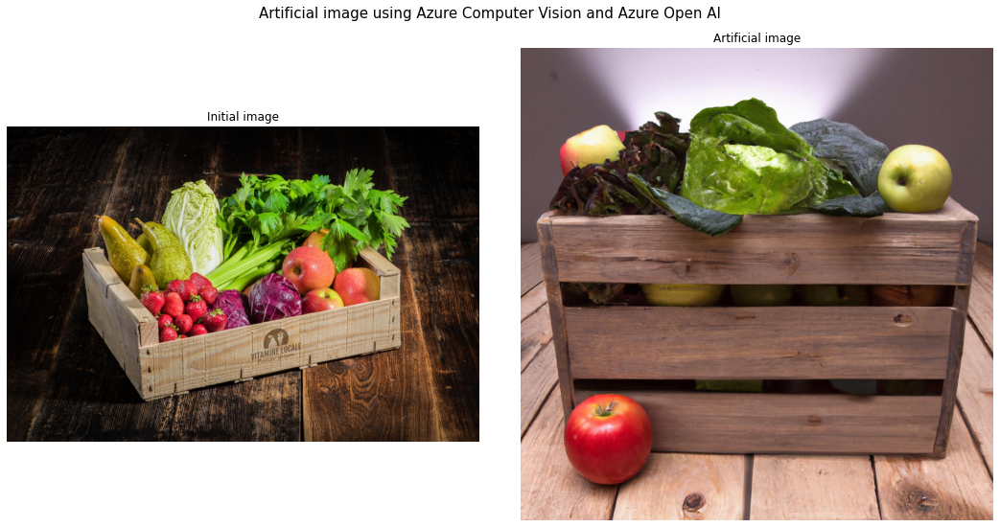

In [20]:
side_by_side(imagefile, outputfile)

image (5).jpg


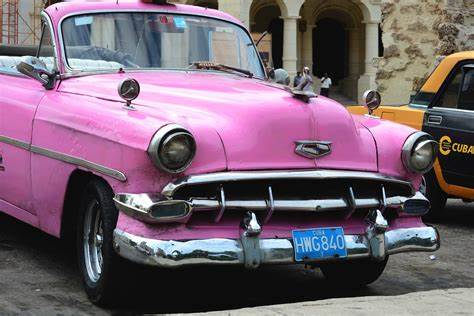

In [21]:
file = jpg_files[4]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (5).jpg

Prompt: a pink car parked on the side of a road,land vehicle,vehicle,wheel,classic car,car,hardtop,antique car,chevrolet bel air,outdoor,auto part,hood,1957 chevrolet,motor vehicle,parked,purple

Artificial image filename: artificial_images/a_pink_car_parked_on_the_side_of_a_road_land_vehic_20230525_101137.jpg


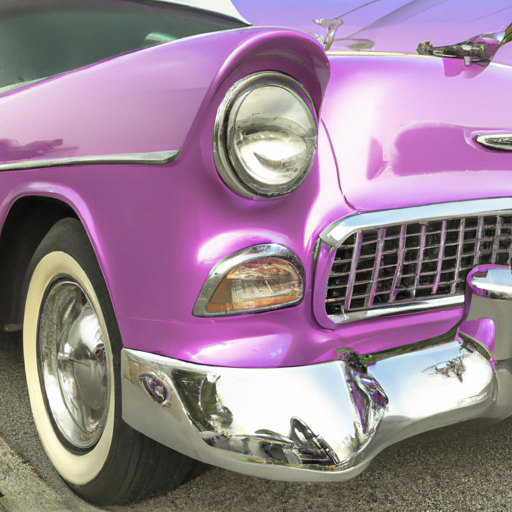


Powered by Azure Computer Vision and Azure Open AI


In [22]:
outputfile = get_dalle2_image(imagefile)

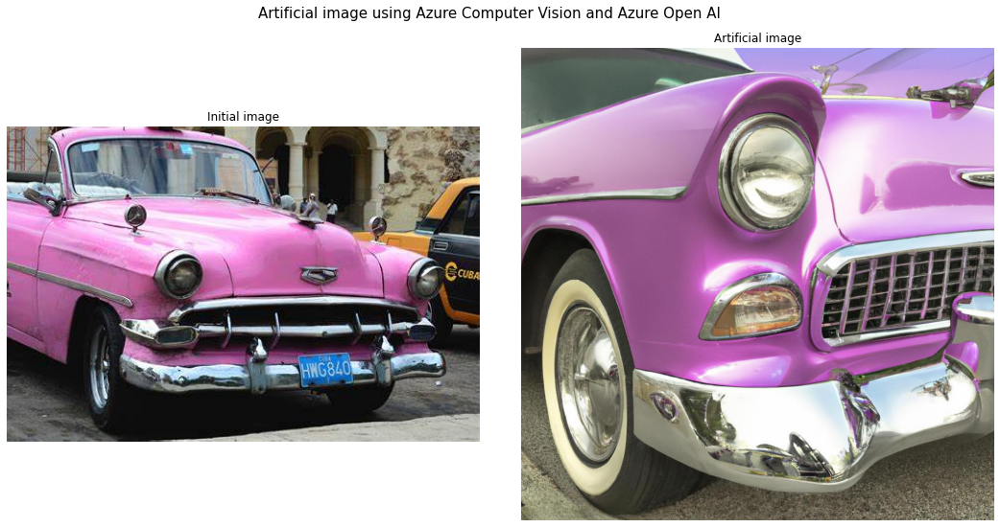

In [23]:
side_by_side(imagefile, outputfile)

image (6).jpg


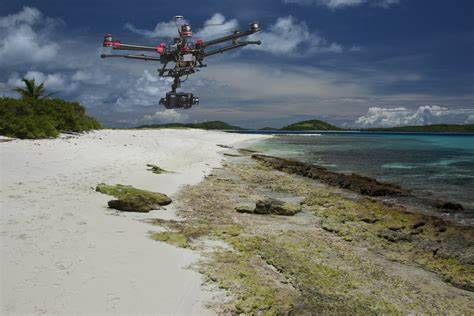

In [24]:
file = jpg_files[5]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (6).jpg

Prompt: a drone flying over a beach,outdoor,cloud,sky,beach,water,ground,landscape

Artificial image filename: artificial_images/a_drone_flying_over_a_beach_outdoor_cloud_sky_beac_20230525_101159.jpg


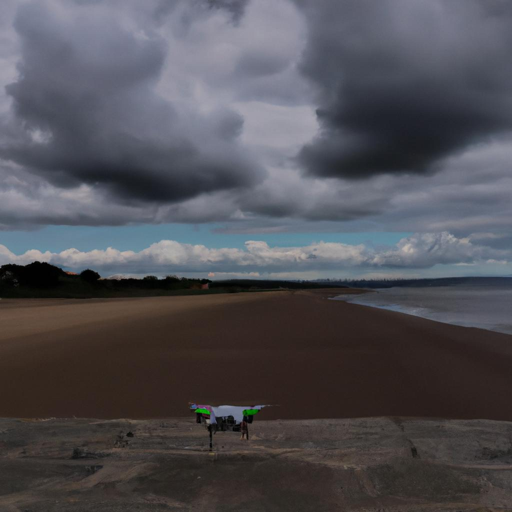


Powered by Azure Computer Vision and Azure Open AI


In [25]:
outputfile = get_dalle2_image(imagefile)

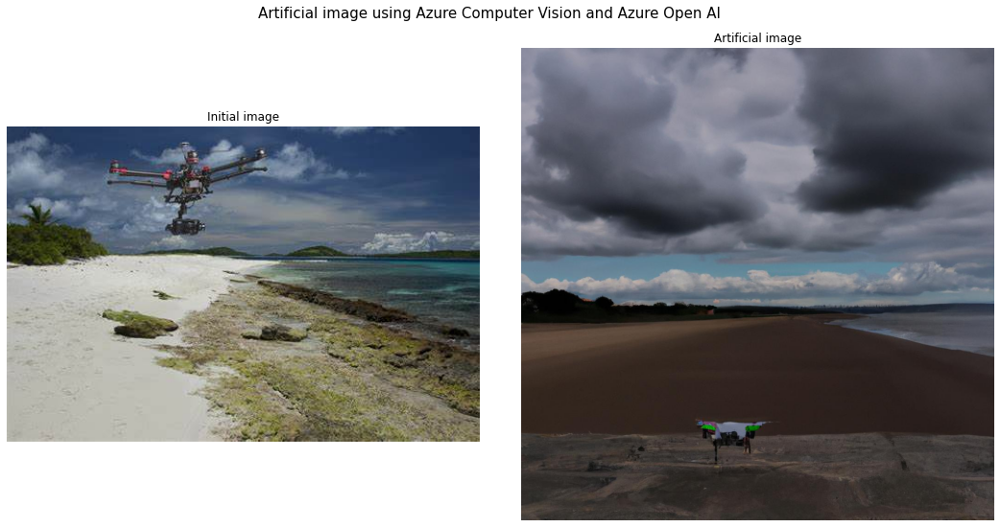

In [26]:
side_by_side(imagefile, outputfile)

image (7).jpg


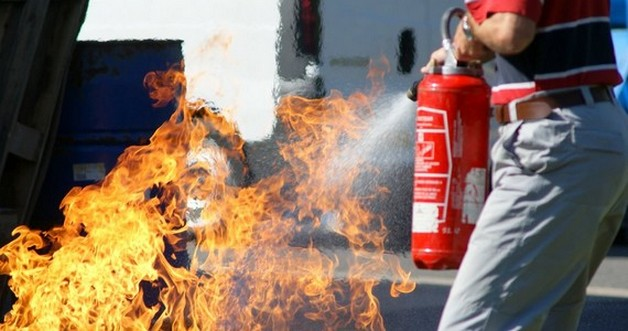

In [27]:
file = jpg_files[6]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (7).jpg

Prompt: a fire extinguisher spraying water,outdoor,fire,firefighter,fire extinguisher,clothing,person,smoke,flame,pollution,man,red

Artificial image filename: artificial_images/a_fire_extinguisher_spraying_water_outdoor_fire_fi_20230525_101218.jpg


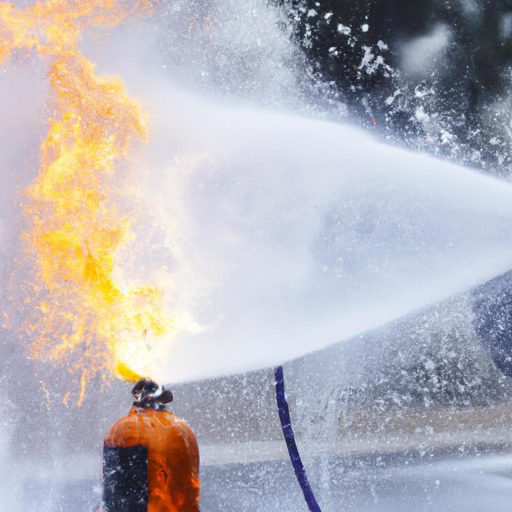


Powered by Azure Computer Vision and Azure Open AI


In [28]:
outputfile = get_dalle2_image(imagefile)

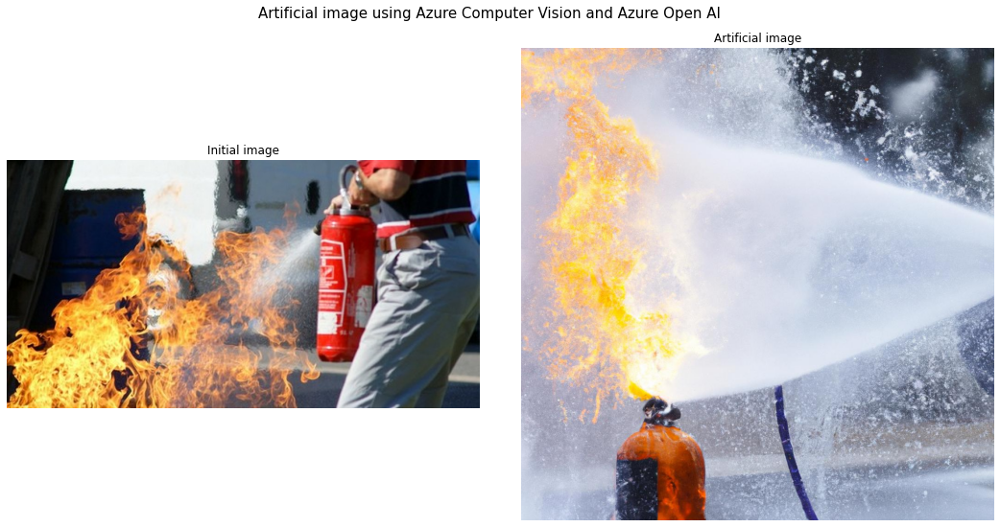

In [29]:
side_by_side(imagefile, outputfile)

image (8).jpg


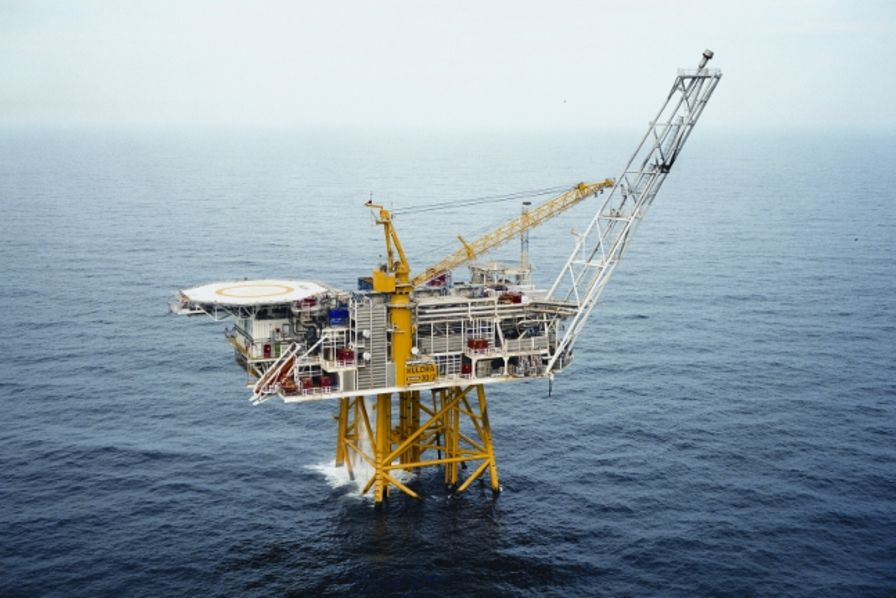

In [30]:
file = jpg_files[7]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (8).jpg

Prompt: a large crane on a platform in the ocean,water,sky,outdoor,hoisting,sea,gear,ship,crane

Artificial image filename: artificial_images/a_large_crane_on_a_platform_in_the_ocean_water_sky_20230525_101238.jpg


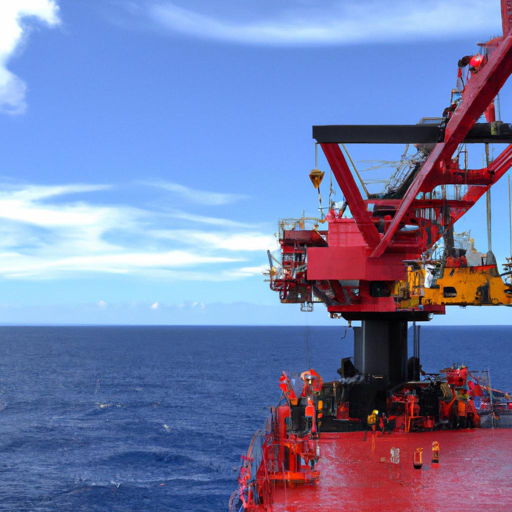


Powered by Azure Computer Vision and Azure Open AI


In [31]:
outputfile = get_dalle2_image(imagefile)

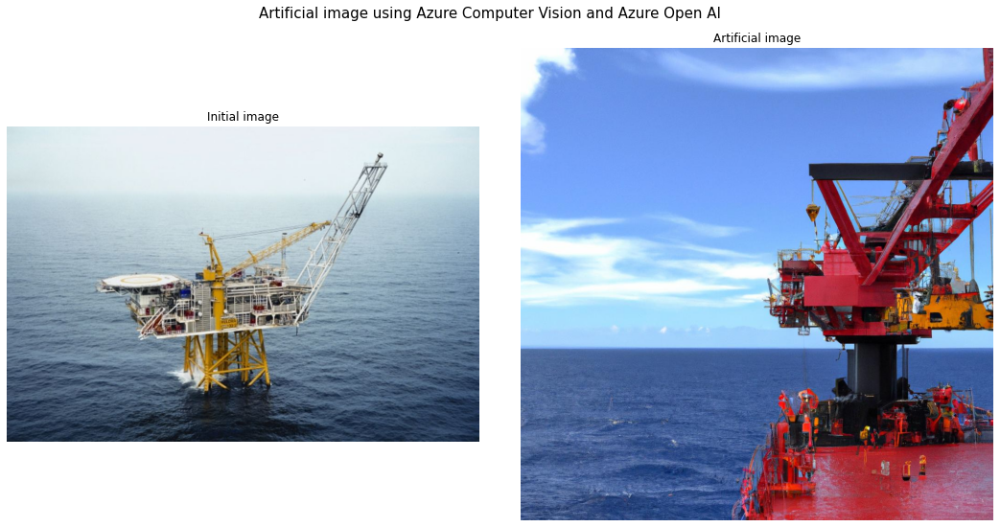

In [32]:
side_by_side(imagefile, outputfile)

image (9).jpg


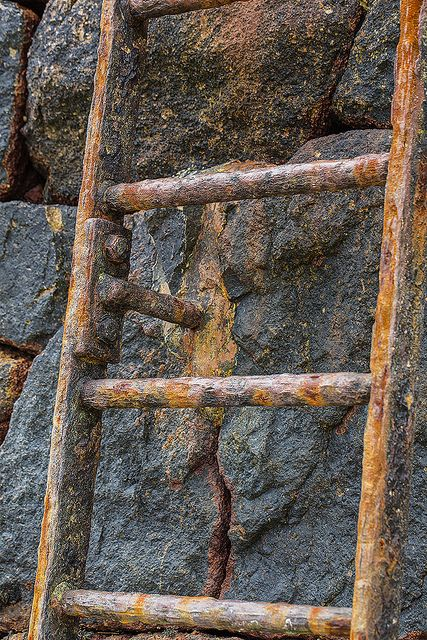

In [33]:
file = jpg_files[8]
imagefile = os.path.join(IMAGES_DIR, file)
print(file)
viewimage(filename=imagefile, width=512)

Generating the artificial image from images/image (9).jpg

Prompt: a rusty ladder leaning against a rock wall,building,rust,stone,outdoor,rock,abstract

Artificial image filename: artificial_images/a_rusty_ladder_leaning_against_a_rock_wall_buildin_20230525_101258.jpg


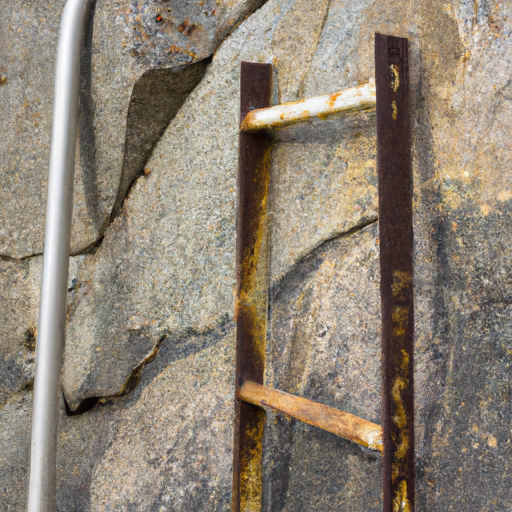


Powered by Azure Computer Vision and Azure Open AI


In [34]:
outputfile = get_dalle2_image(imagefile)

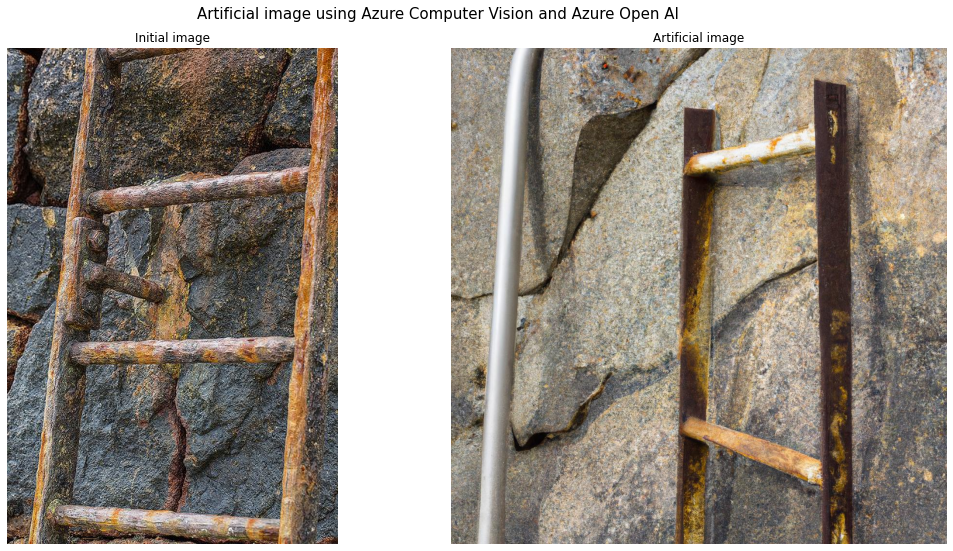

In [35]:
side_by_side(imagefile, outputfile)